In [37]:
import torch
import cv2
import augly
import pickle
from icecream import ic
from PIL import Image
from pathlib import Path
from torch import nn
from torch.utils.data import Dataset, DataLoader


import torchvision.transforms as transforms
import augly.image.transforms as imaugs
import augly.image.intensity as imten
import augly.image.functional as imfunc
from augly.image import aug_np_wrapper, overlay_emoji


In [38]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
 

In [39]:
class LabelProc():
    def __init__(self, ty="binary", threshold=3, func=sum):
        self.type = ty
        self.threshold = threshold
        self.func = func

    def __call__(self, label):
        # ic(label)
        if self.type == "binary":
            suml = self.func(label)
            if suml > self.threshold:
                return 1
            else:
                return 0
        elif self.type == "type":
            label_lks = self.func(label[:4])
            label_fus = self.func(label[4:8])
            label_com = self.func(label[8:12])
            label_ver = self.func(label[13:16])
            lks = fus = com = ver = 0
            if label_lks > self.threshold:
                lks = 1
            elif label_fus > self.threshold:
                fus = 1
            elif label_com > self.threshold:
                com = 1
            elif label_ver > self.threshold:
                ver = 1
            return lks, fus, com, ver



In [40]:
def trans():
    AUGMENTATIONS = [
        imaugs.RandomBrightness(),
        # imaugs.RandomRotation(),
        imaugs. ApplyLambda(),
        imaugs.RandomBlur(),
        imaugs.RandomNoise(),
        imaugs.Contrast(),
        imaugs.Opacity(),
    ]

    TENSOR_TRANSFORMS = transforms.Compose(AUGMENTATIONS)
    return TENSOR_TRANSFORMS



In [41]:
class SalmonDataset(Dataset):
    def __init__(self, data_paths, labelproc, transform=None):
        with open(data_paths, "rb") as f:
            data = pickle.load(f)
        self.data = data
        self.labelproc = labelproc
        self.transform = transform
        self.ttensor = transforms.Compose([transforms.ToTensor()])
        self.tnorm = torch.nn.Sequential(
            transforms.Normalize(0.5, 0.5),
        )

        # norm = transforms.Normalize(0.5, (0.0)),
        # self.tnorm = transforms.Compose([norm])
        # ic(self.data["labels"])
    #         print(data["keys"])

    def __len__(self):
        return len(self.data["keys"])

    def __getitem__(self, idx):
        name = self.data["keys"][idx]
        img = self.data["images"][name]
        label = self.data["labels"][name]
        if self.transform:
            img = self.transform(img)
        img = self.ttensor(img)
        img = self.tnorm(img)
        label = self.labelproc(label)
        return img, label


In [42]:
output = Path("./outputs")
# output.mkdir(exist_ok=True)
if output.exists():
    output.rmdir()
output.mkdir(exist_ok=True)
transform = trans()
transform = None
labelproc = LabelProc(ty="binary", threshold=2, func=max)
dataset = SalmonDataset("pre_load1.pk", labelproc, transform=transform)


ic| data[0].shape: torch.Size([4, 1, 512, 512])


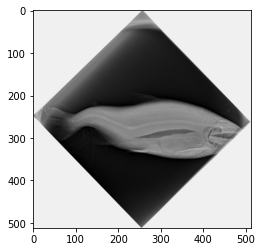

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


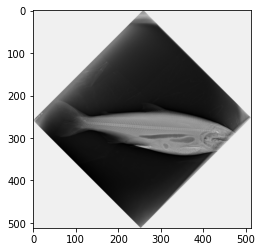

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


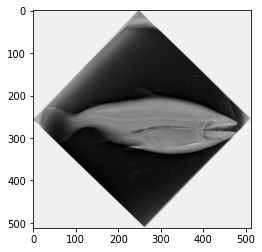

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


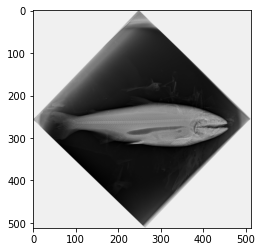

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


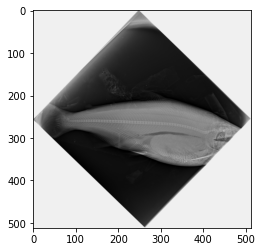

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


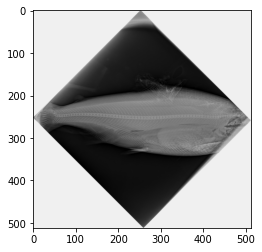

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


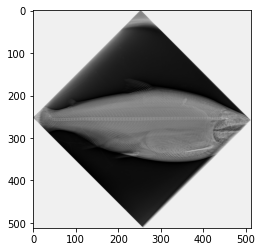

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


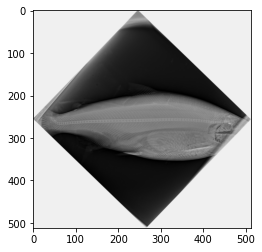

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


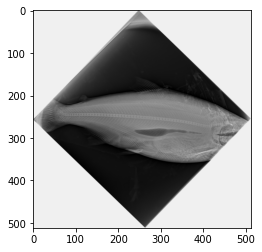

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


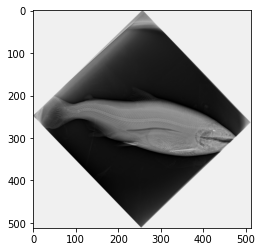

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


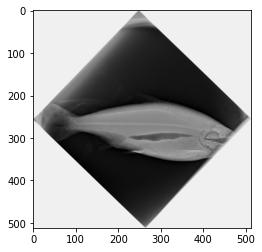

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


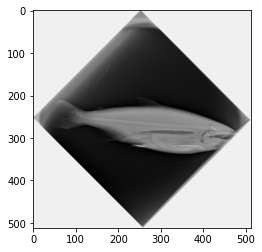

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


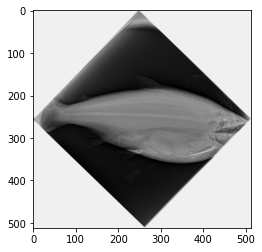

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


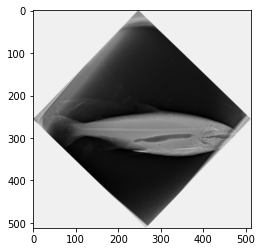

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


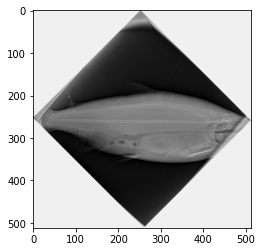

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


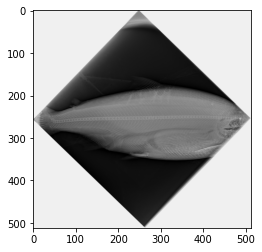

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


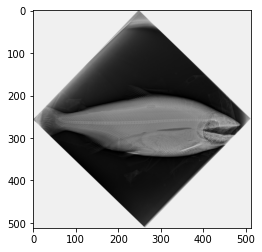

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


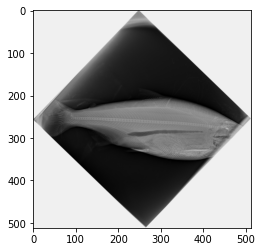

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


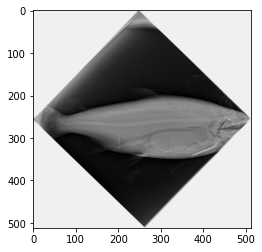

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


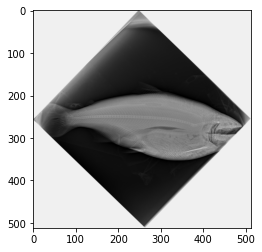

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


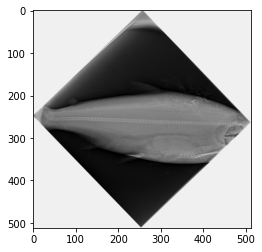

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


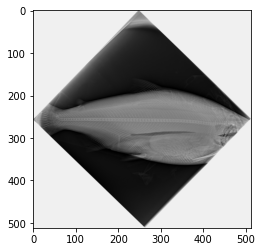

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


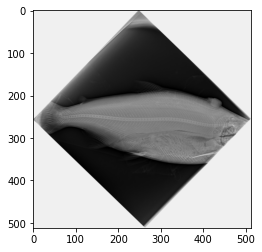

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


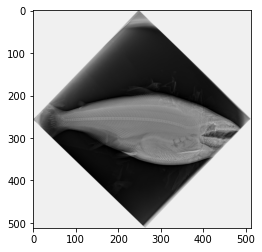

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


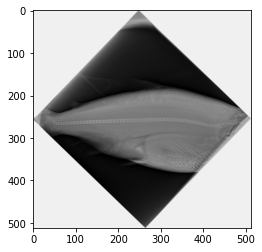

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


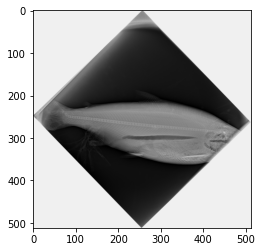

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


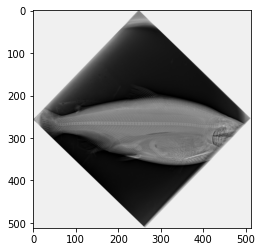

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


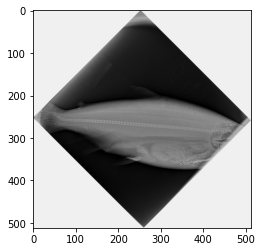

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


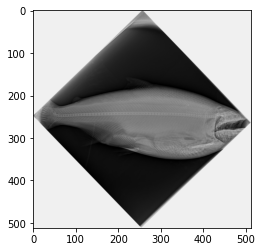

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


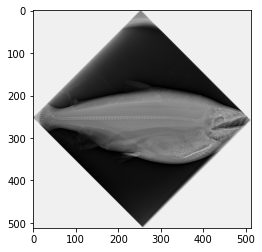

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


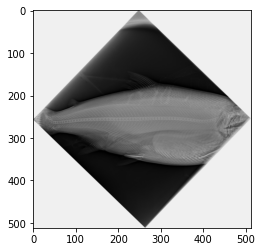

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


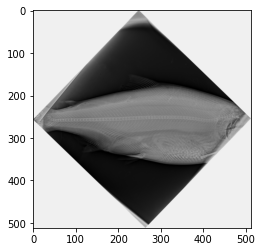

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


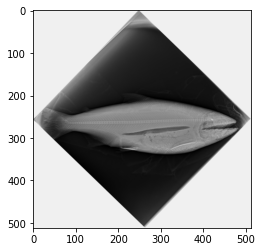

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


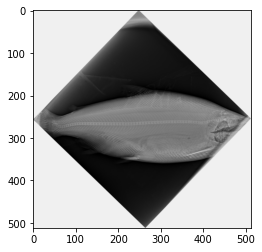

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


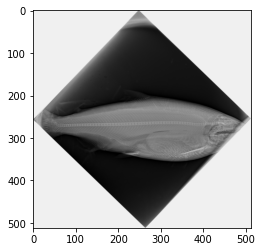

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


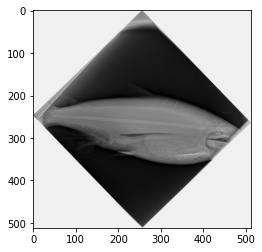

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


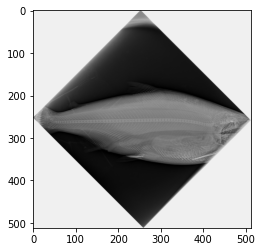

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


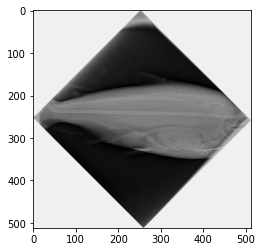

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


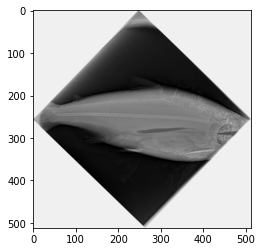

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


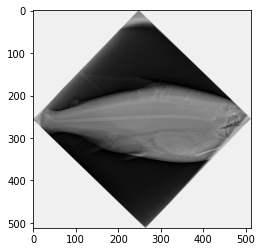

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


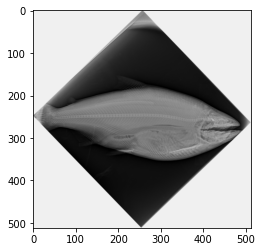

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


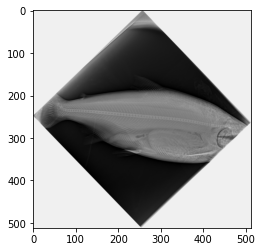

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


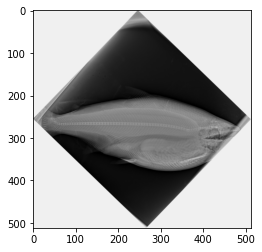

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


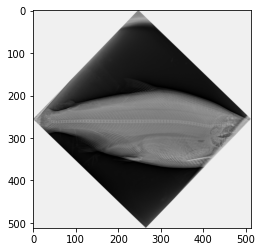

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


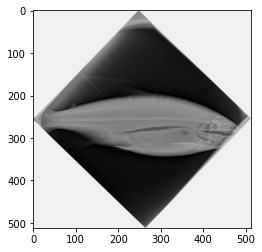

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


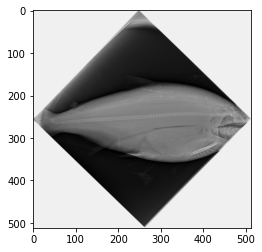

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


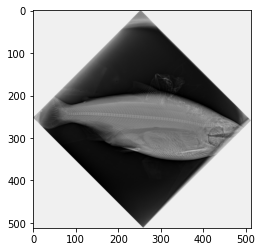

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


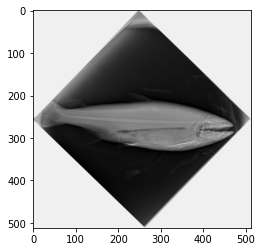

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


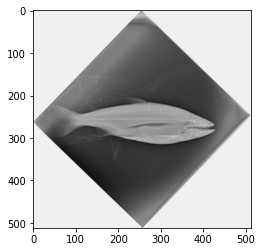

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


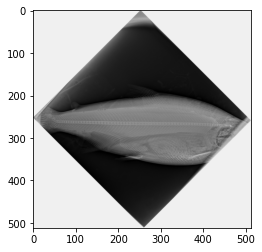

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


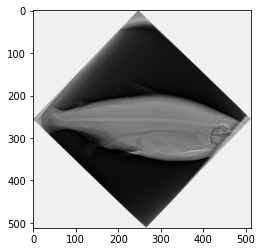

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


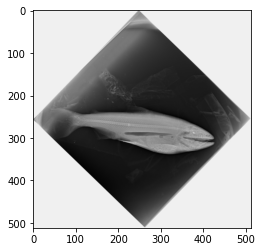

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


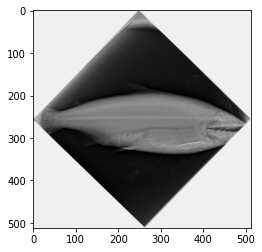

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


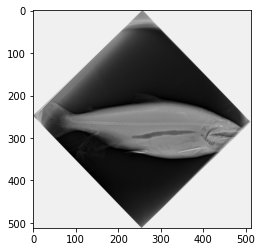

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


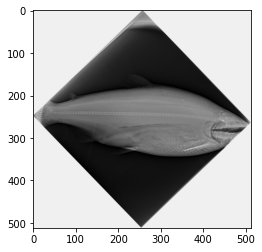

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


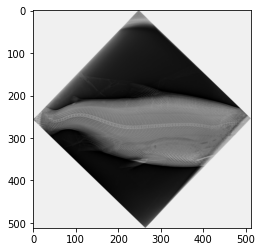

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


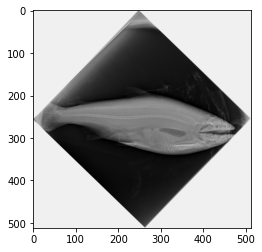

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


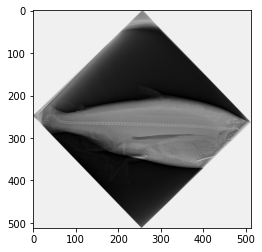

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


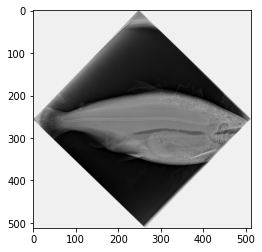

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


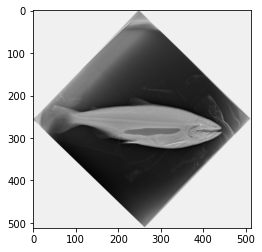

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


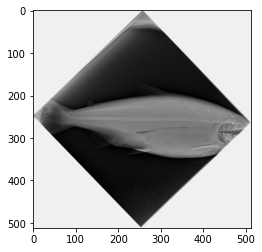

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


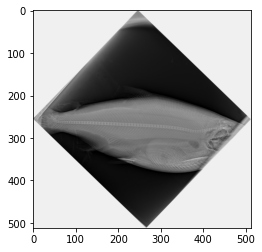

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


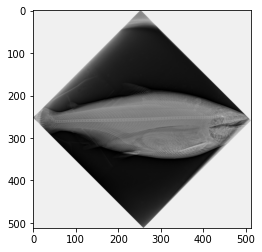

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


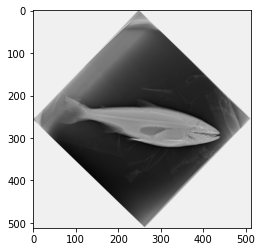

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


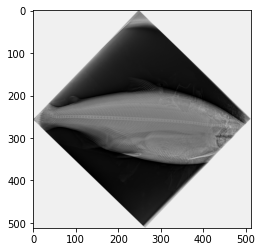

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


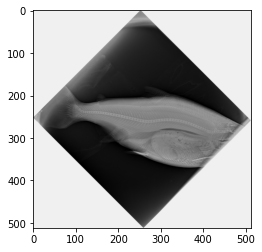

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


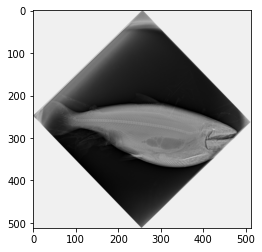

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


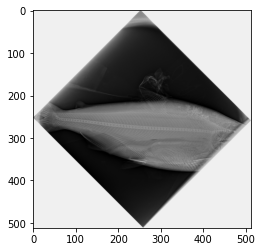

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


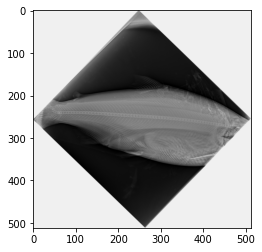

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


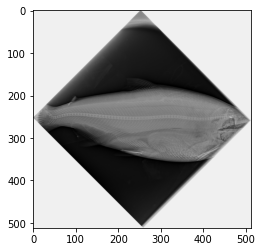

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


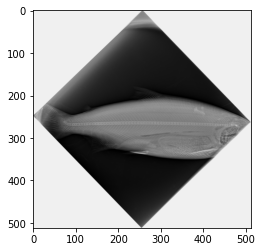

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


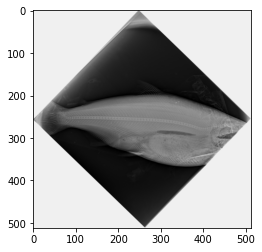

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


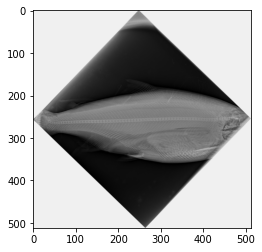

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


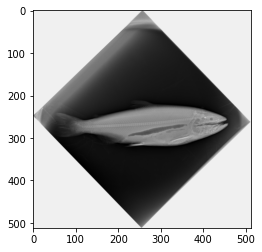

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


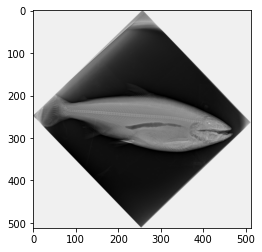

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


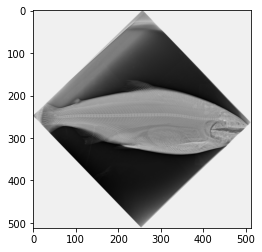

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


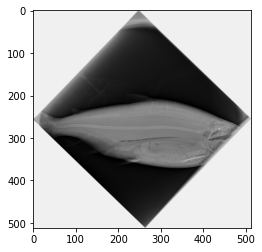

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


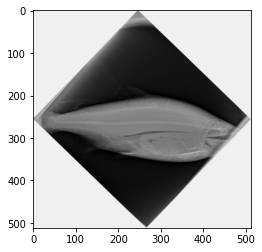

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


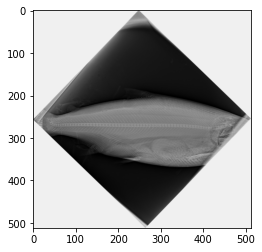

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


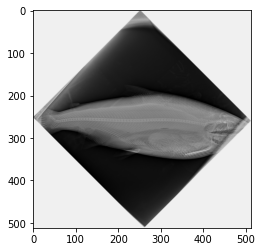

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


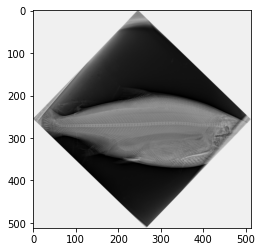

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


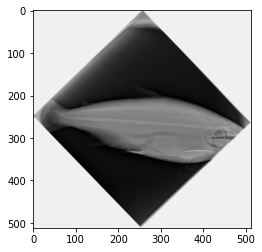

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


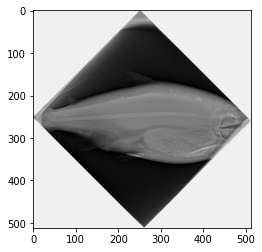

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


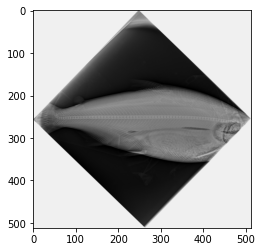

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


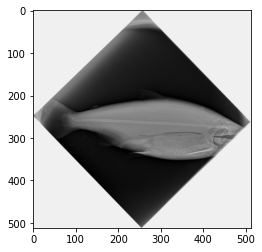

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


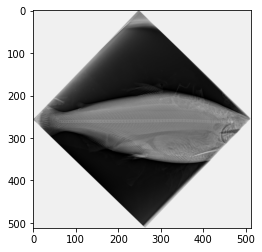

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


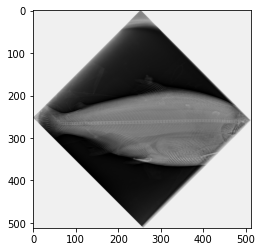

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


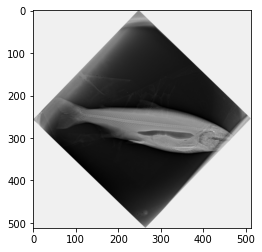

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


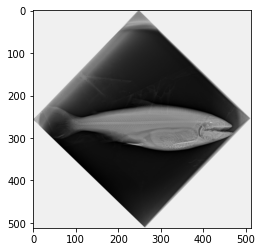

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


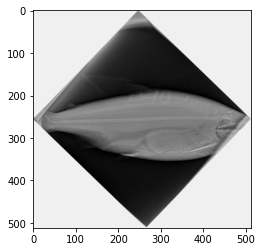

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


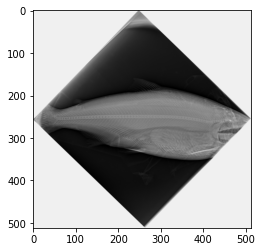

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


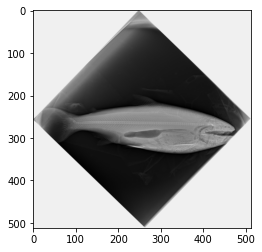

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


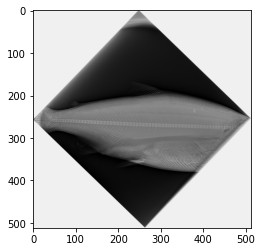

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


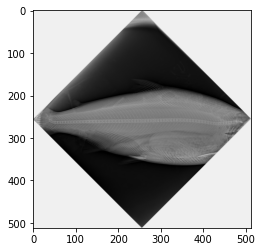

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


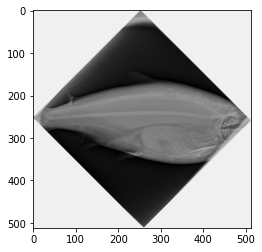

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


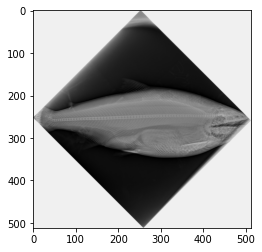

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


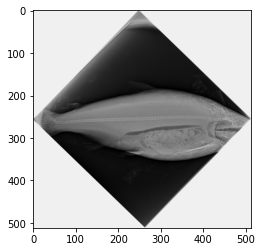

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


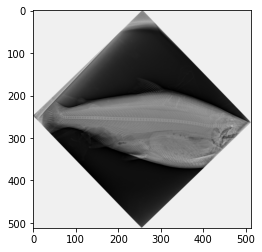

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


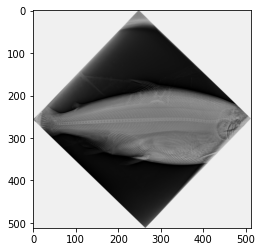

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


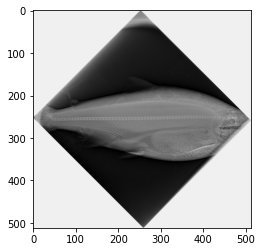

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


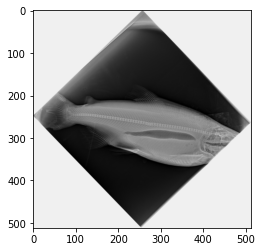

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


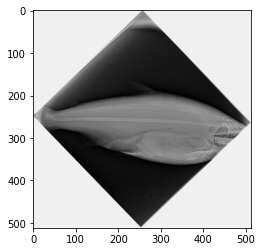

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


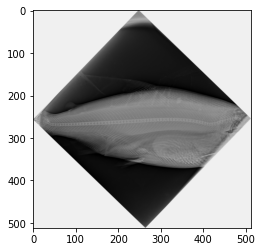

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


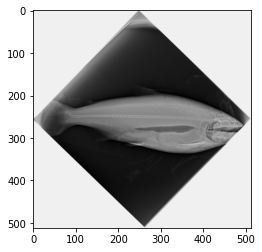

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


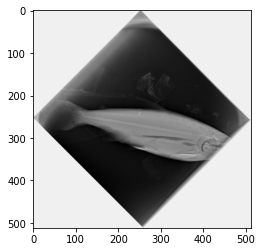

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


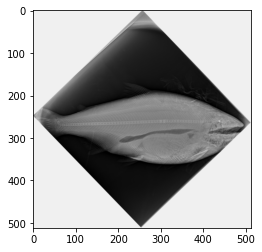

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


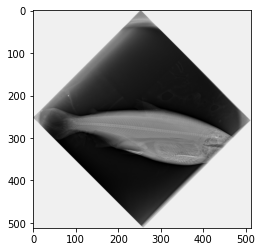

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


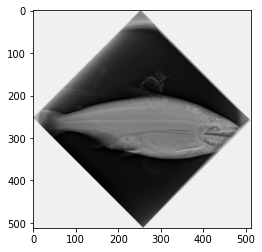

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


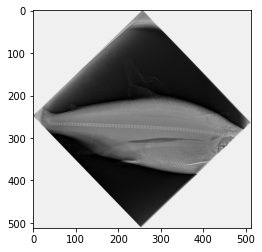

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


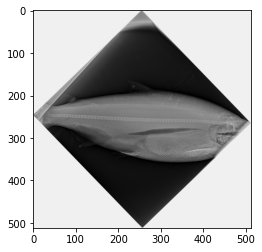

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


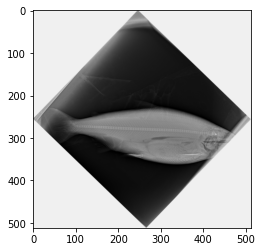

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


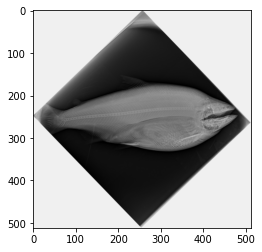

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


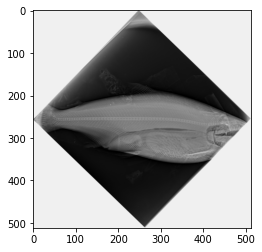

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


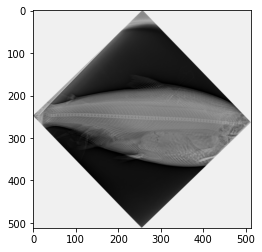

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


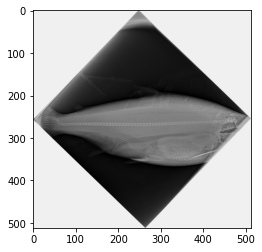

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


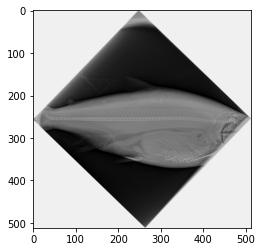

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


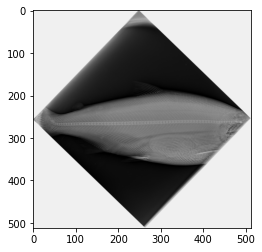

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


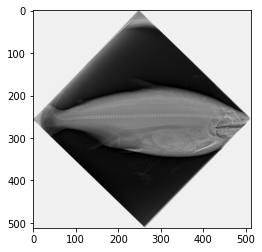

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


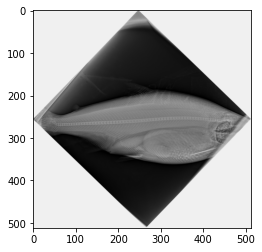

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


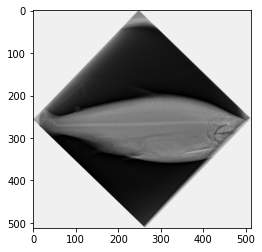

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


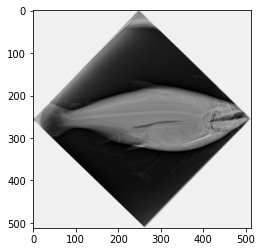

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


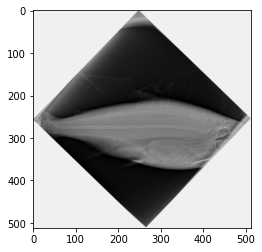

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


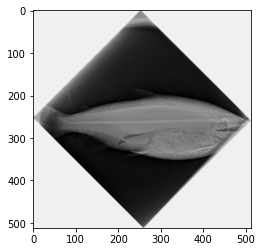

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


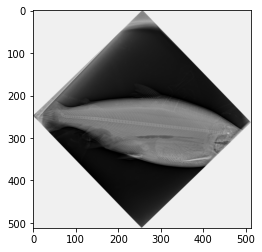

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


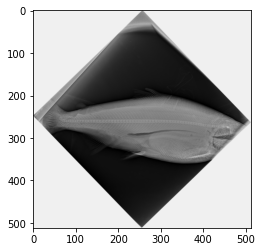

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


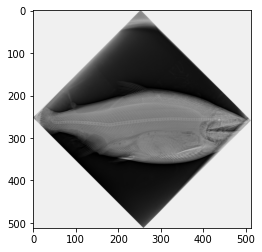

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


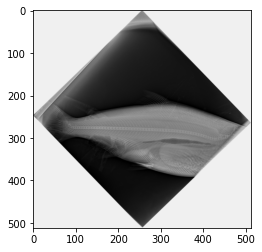

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


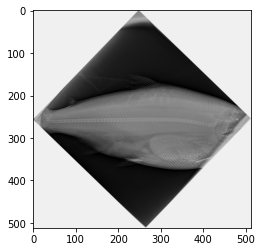

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


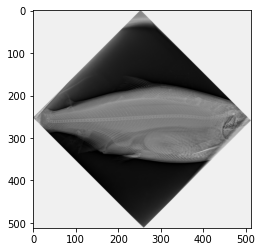

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


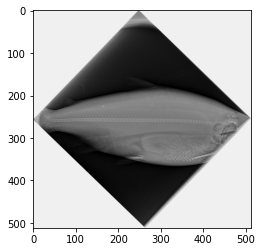

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


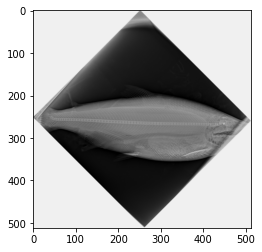

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


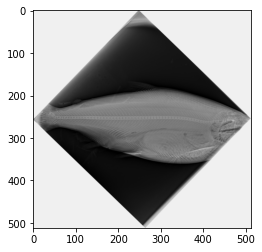

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


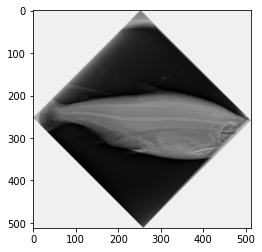

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


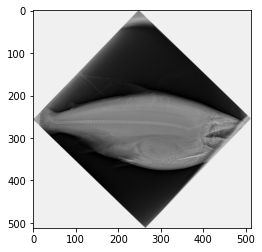

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


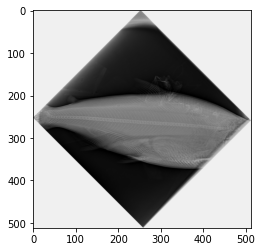

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


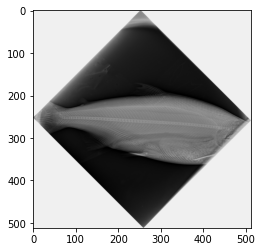

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


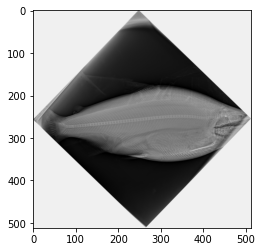

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


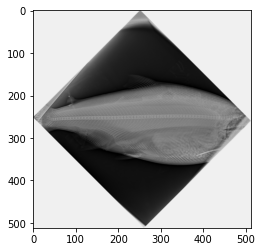

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


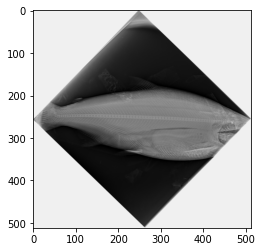

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


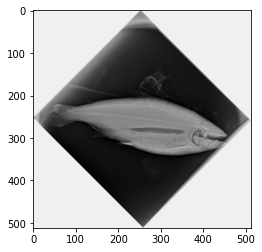

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


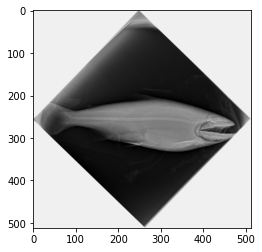

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


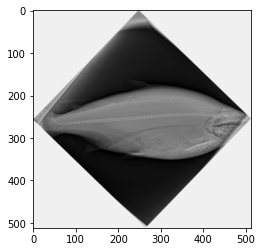

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


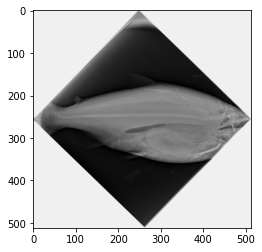

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


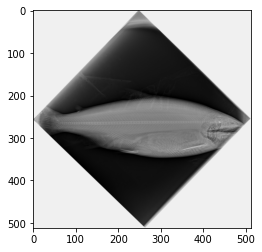

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


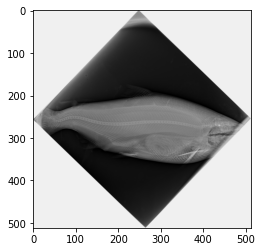

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


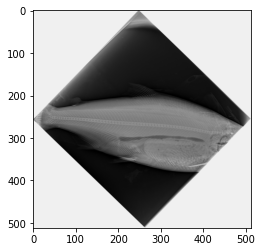

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


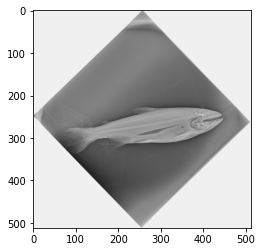

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


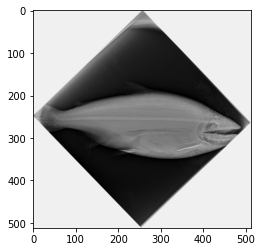

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


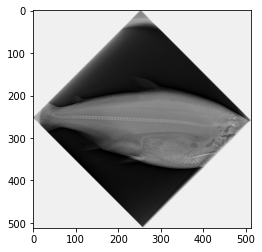

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


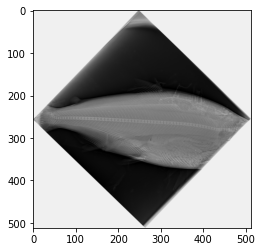

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


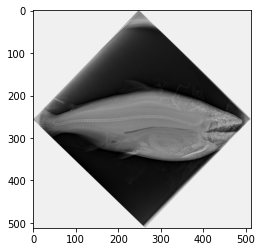

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


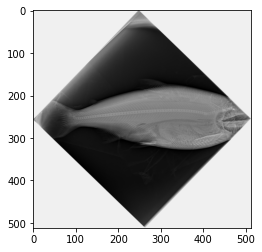

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


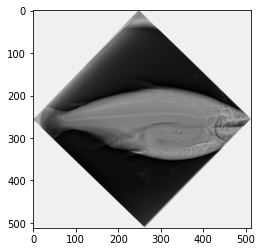

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


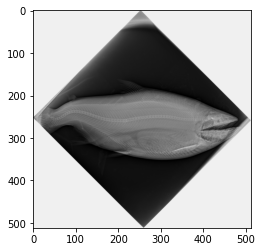

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


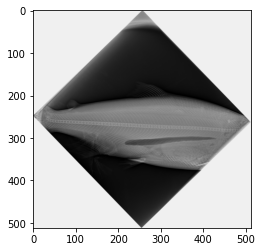

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


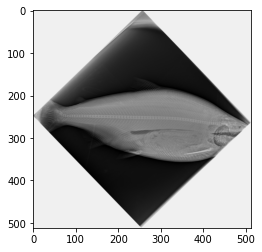

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


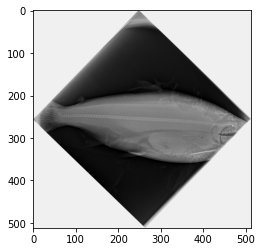

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


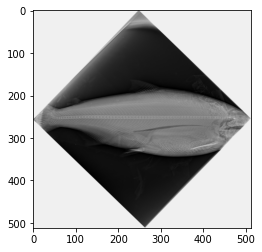

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


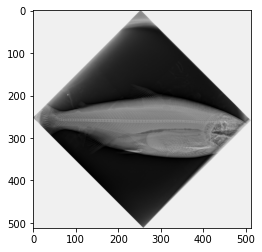

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


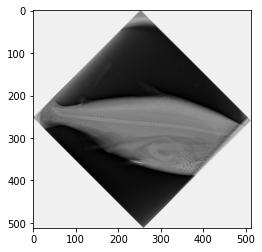

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


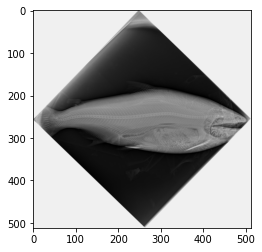

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


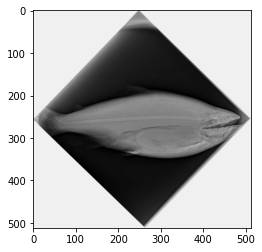

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


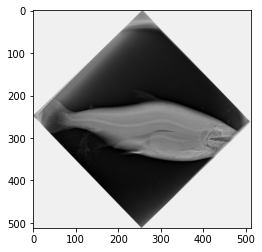

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


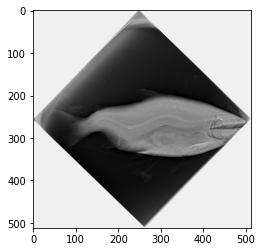

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


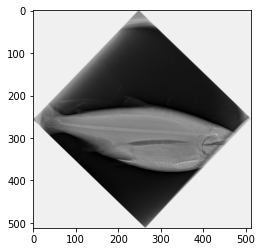

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


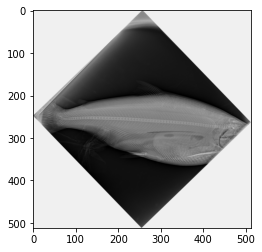

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


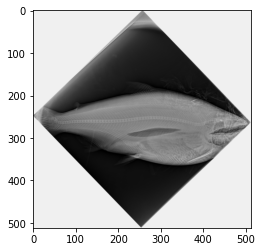

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


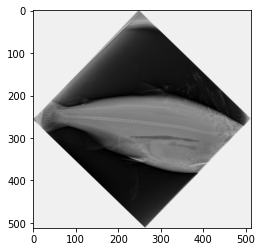

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


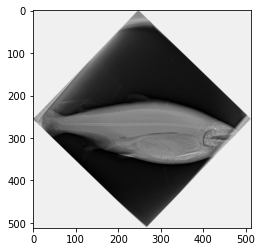

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


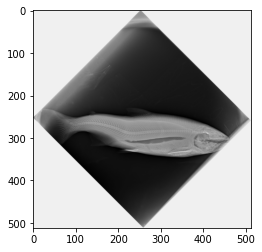

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


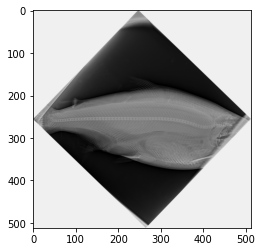

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


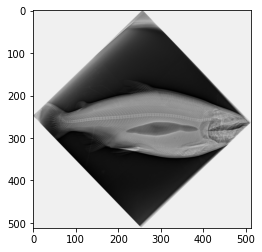

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


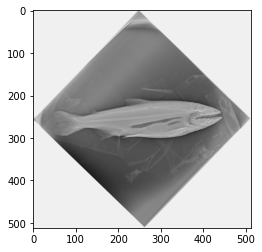

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


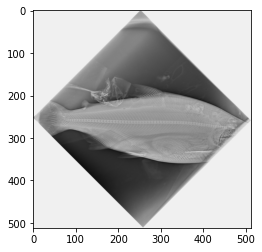

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


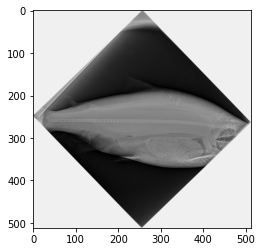

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


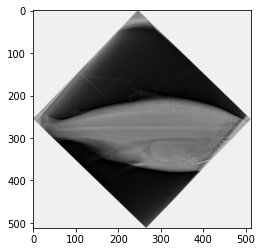

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


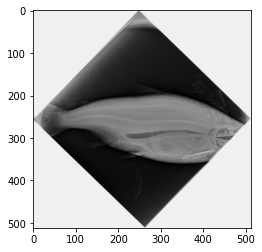

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


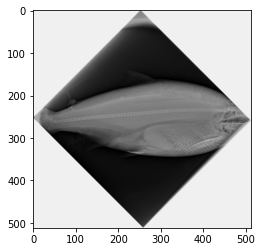

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


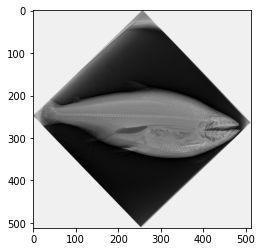

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


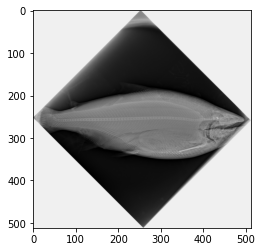

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


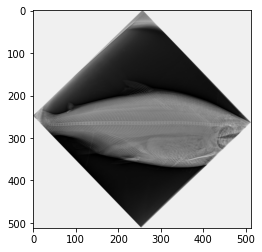

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


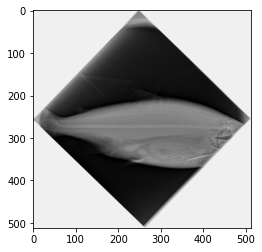

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


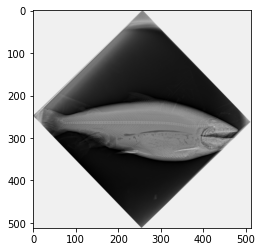

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


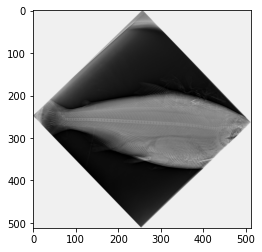

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


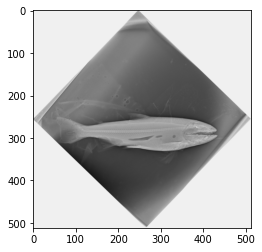

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


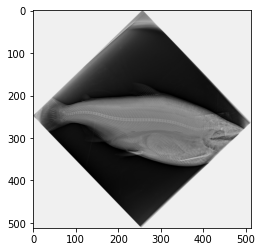

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


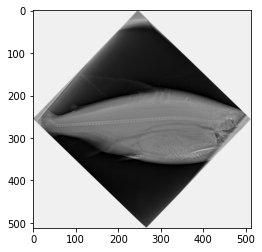

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


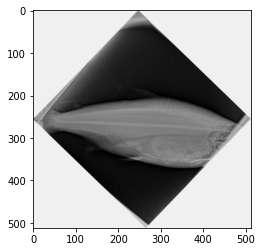

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


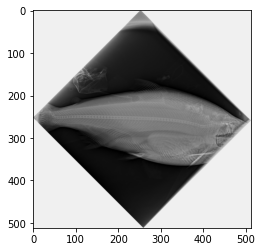

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


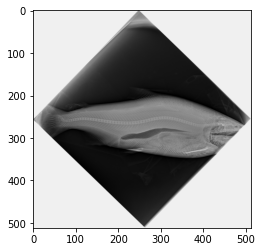

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


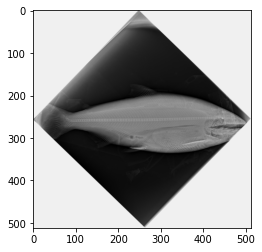

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


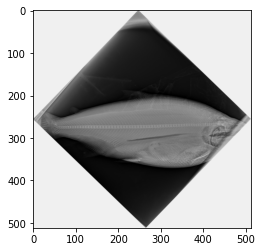

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


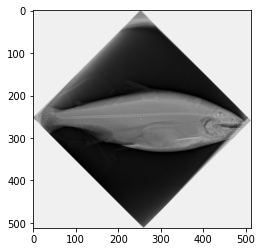

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


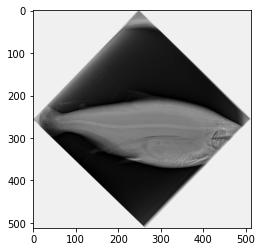

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


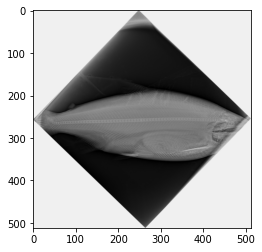

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


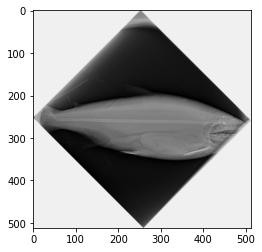

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


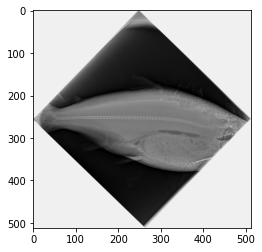

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


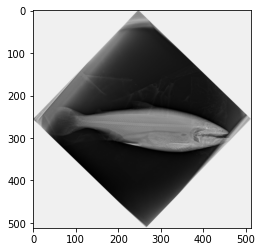

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


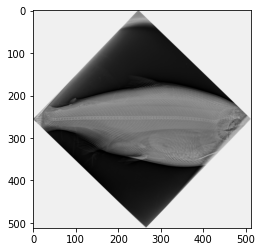

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


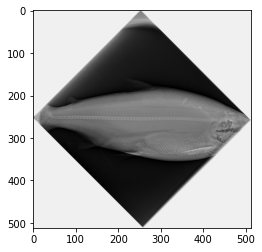

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


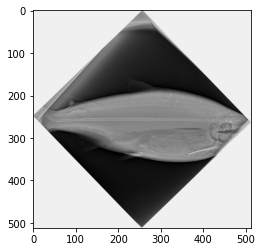

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


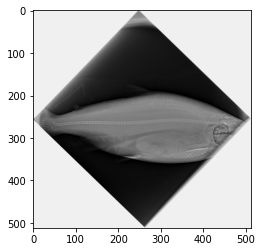

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


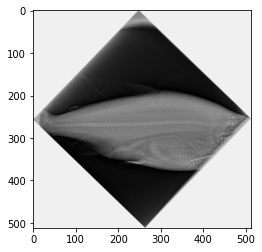

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


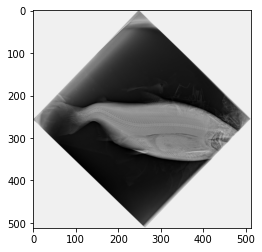

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


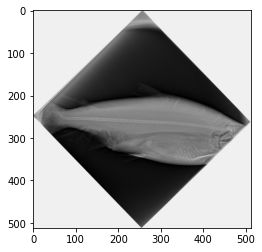

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


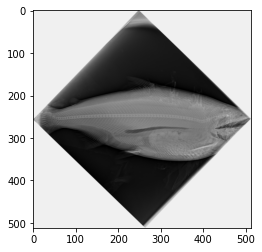

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


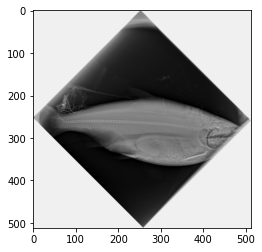

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


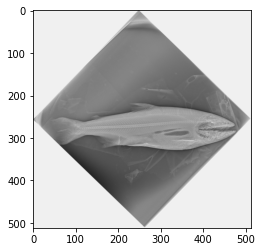

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


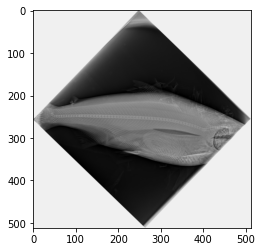

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


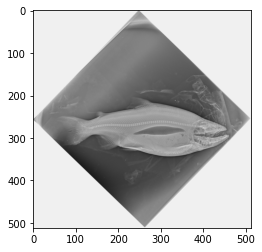

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


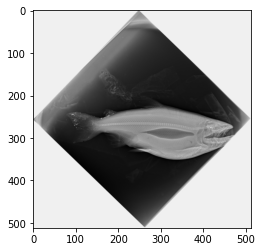

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


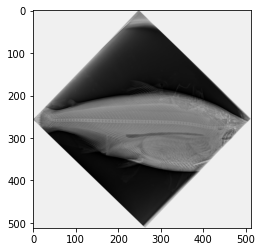

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


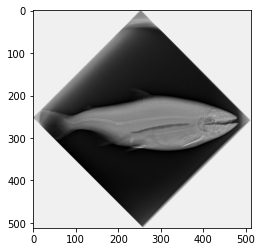

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


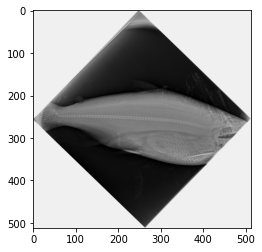

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


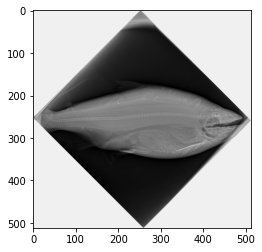

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


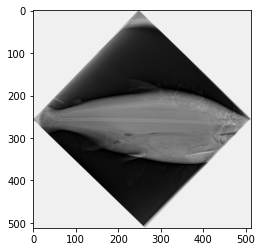

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


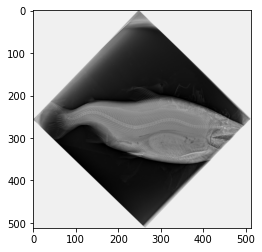

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


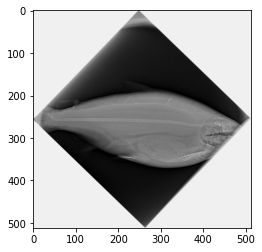

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


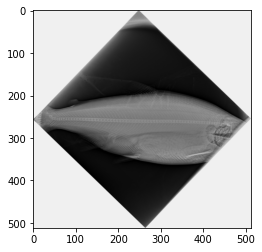

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


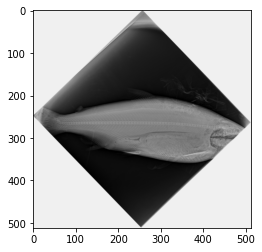

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


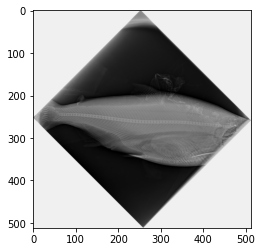

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


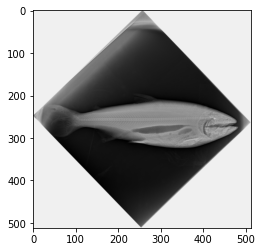

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


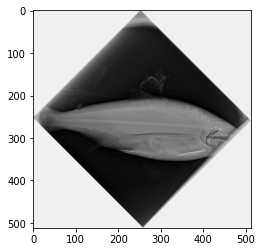

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


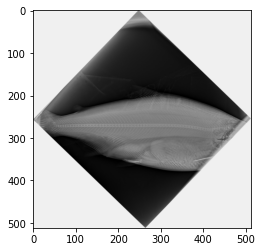

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


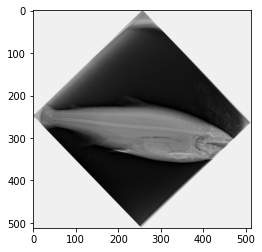

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


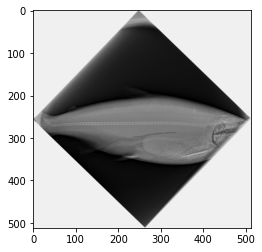

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


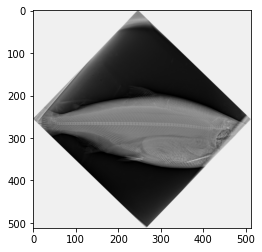

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


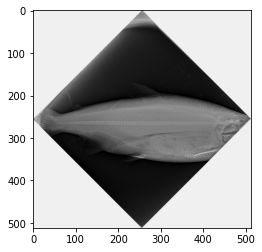

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


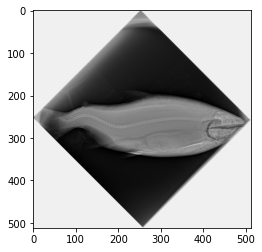

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


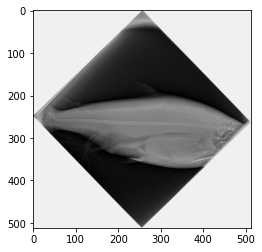

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


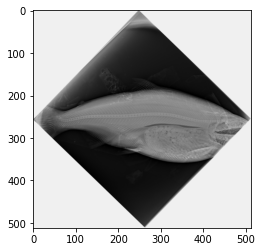

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


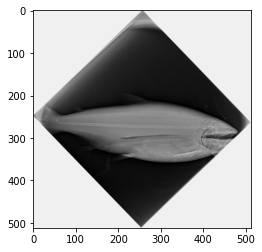

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


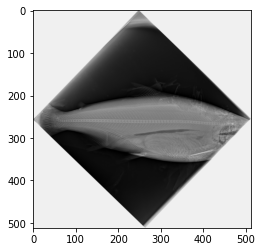

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


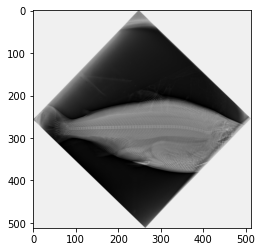

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


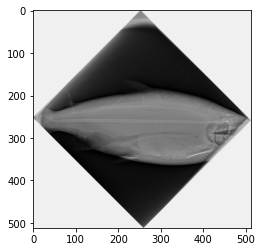

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


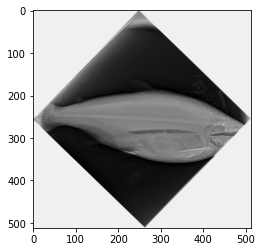

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


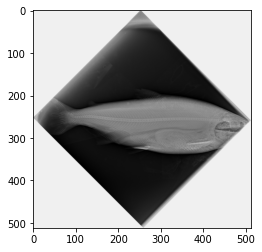

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


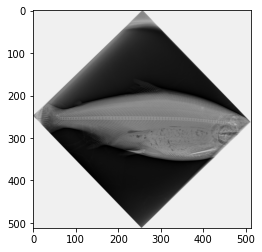

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


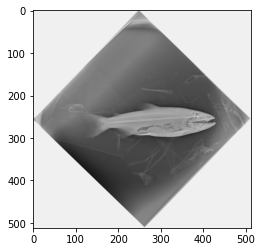

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


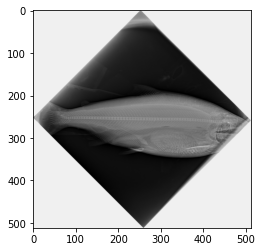

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


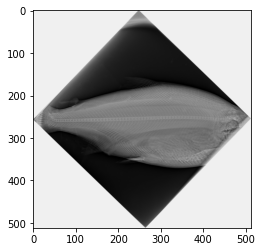

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


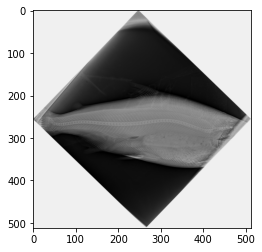

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


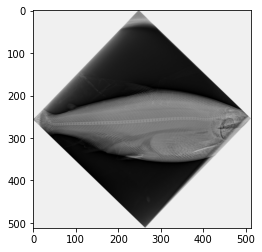

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


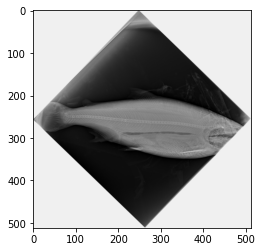

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


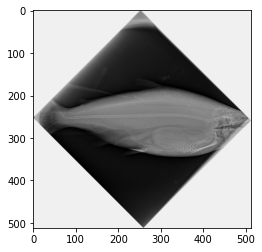

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


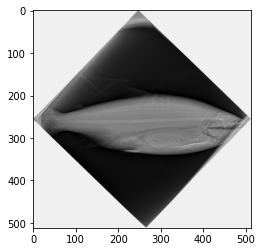

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


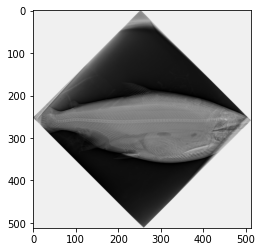

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


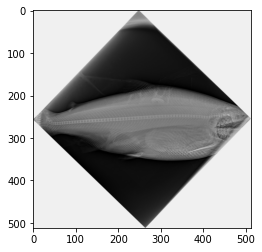

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


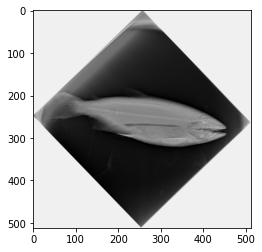

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


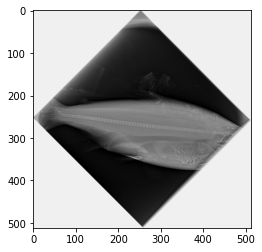

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


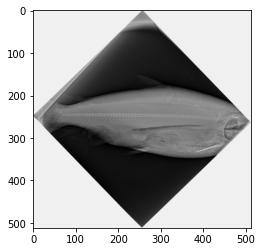

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


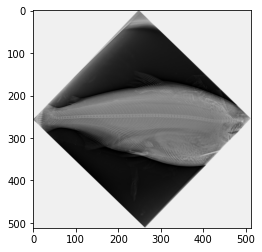

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


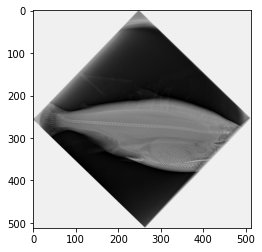

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


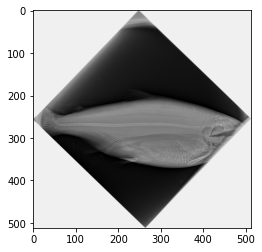

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


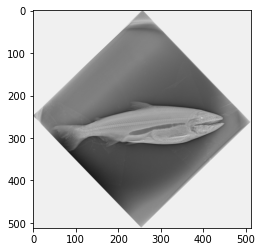

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


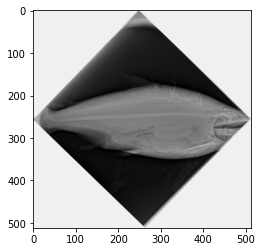

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


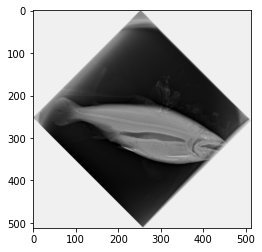

ic| data[1][0]: tensor(1)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


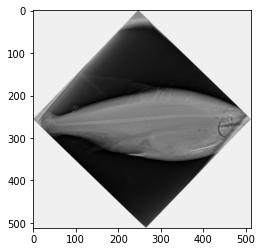

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


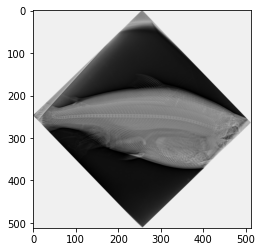

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


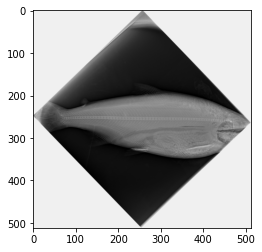

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


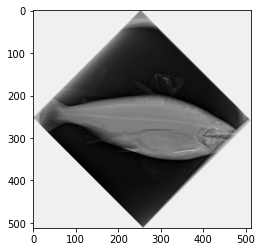

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


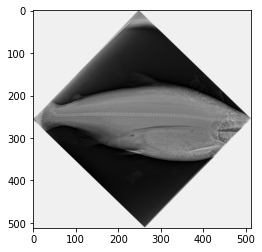

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


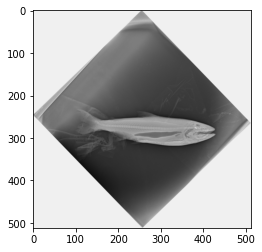

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


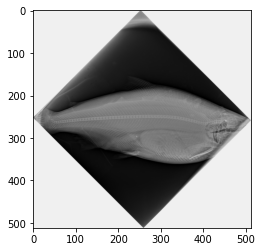

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


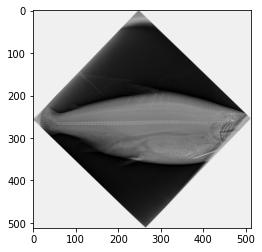

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


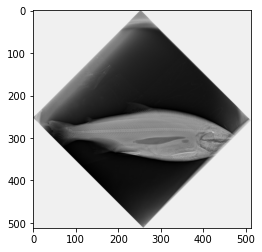

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


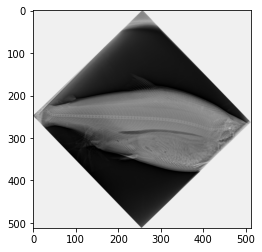

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


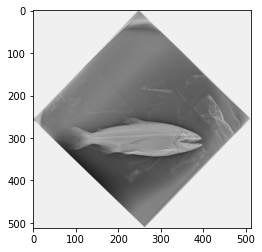

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


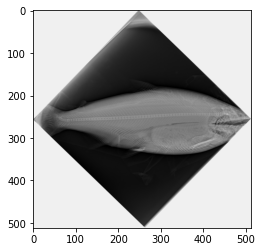

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


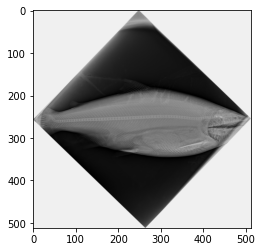

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


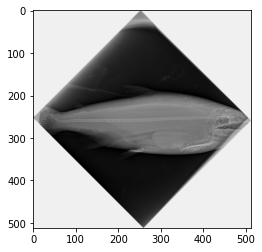

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


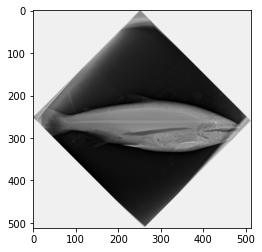

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


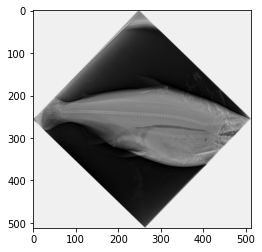

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


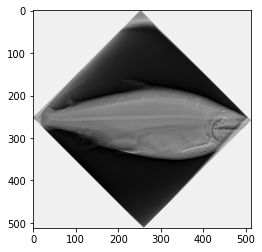

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


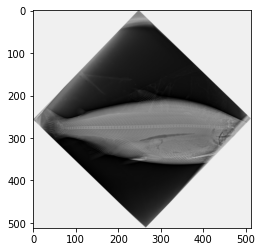

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


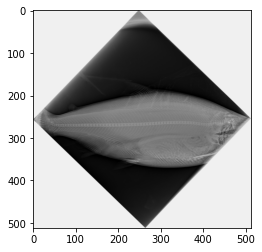

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


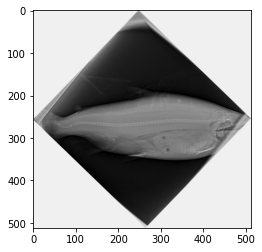

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


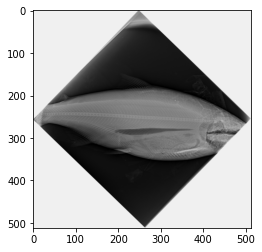

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


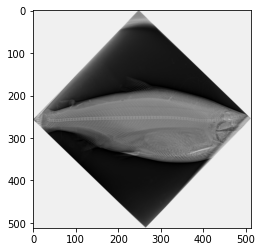

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


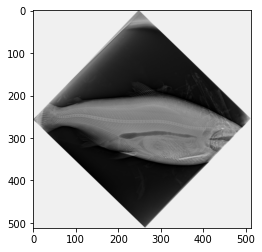

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


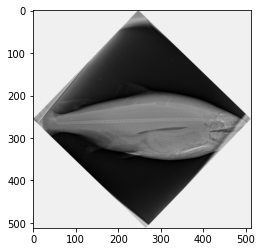

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


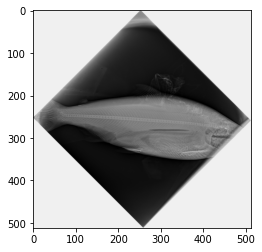

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


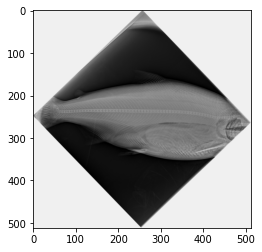

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


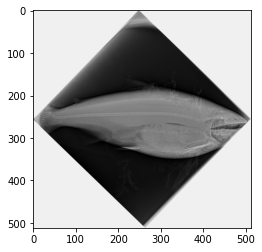

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


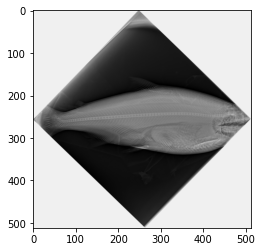

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


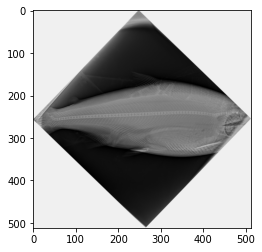

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


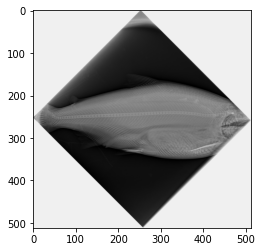

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


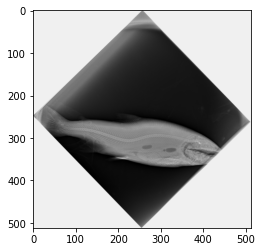

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


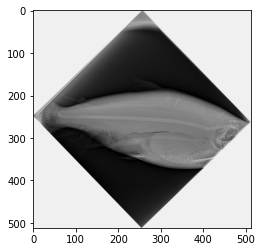

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


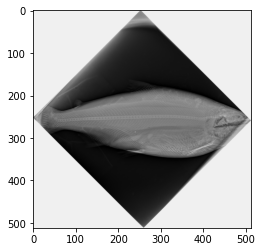

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


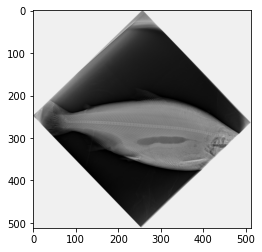

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


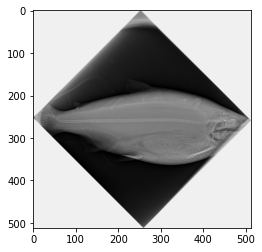

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


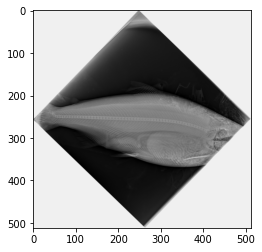

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


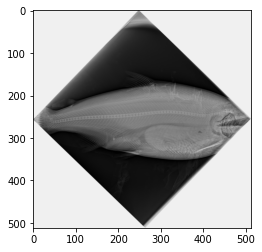

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


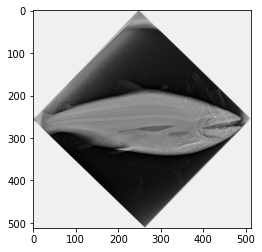

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


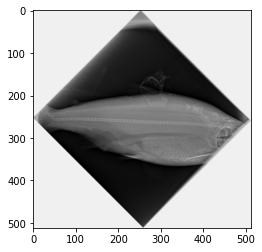

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


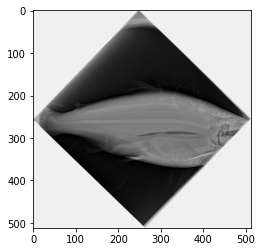

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


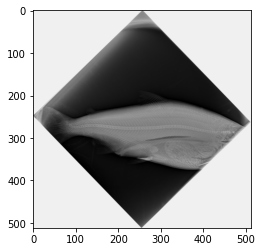

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([4, 1, 512, 512])


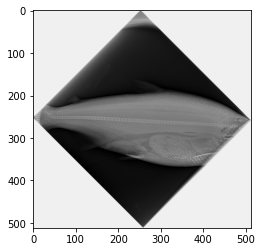

ic| data[1][0]: tensor(0)
ic| data[0].shape: torch.Size([2, 1, 512, 512])


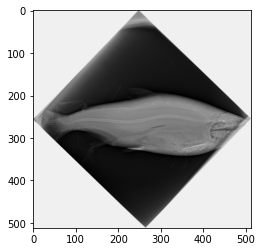

ic| data[1][0]: tensor(0)


In [36]:
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from icecream import ic
dataset_loader = torch.utils.data.DataLoader(dataset,
                                             batch_size=4, shuffle=True,
                                             num_workers=4)
for data in dataset_loader:
#     ic(data[1])
    ic(data[0].shape)
    imshow(torchvision.utils.make_grid(data[0][0]))
    ic(data[1][0])

